<a href="https://colab.research.google.com/github/DaisyLiu1996/style_transfer_85/blob/master/Copy_of_Snippets_Importing_libraries.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip -q install tensorflow-gpu==2.0.0-alpha0

     |████████████████████████████████| 332.1MB 48kB/s 
     |████████████████████████████████| 3.0MB 60.6MB/s 
     |████████████████████████████████| 419kB 49.0MB/s 


In [2]:
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.losses import mean_squared_error, mean_absolute_error

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output
import numpy as np

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or 

In [0]:
def normalize(input_image):
    input_image = (input_image / 127.5) - 1
    return input_image

In [0]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    image = tf.cast(image, tf.float32)
    return image

def load_image_train(image_file):
    input_image = load(image_file)
    input_image = normalize(input_image)
    return input_image

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


(256, 256, 3)


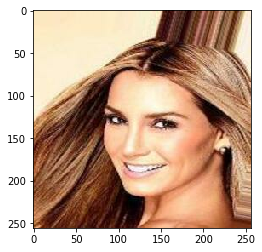

In [6]:
PATH = '/content/gdrive/My Drive/188 HW3/train/'
inpA = load(os.path.join(PATH, 'human/000001.jpg'))
print(inpA.shape)
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inpA/255.0)

(256, 256, 3)


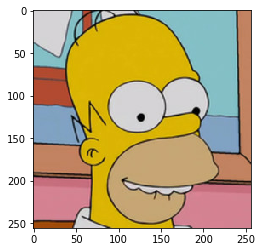

In [7]:
inpB = load(os.path.join(PATH, 'simpson/1.jpg'))
print(inpB.shape)

plt.figure()
plt.imshow(inpB/255)

In [0]:
BATCH_SIZE = 1
base_dir = '/content/gdrive/My Drive/188 HW3/train/'
BUFFER_SIZE = 32

trainA_dataset = tf.data.Dataset.list_files(PATH+'human/*.jpg')
trainA_dataset = trainA_dataset.shuffle(BUFFER_SIZE)
trainA_dataset = trainA_dataset.map(load_image_train)
trainA_dataset = trainA_dataset.batch(BATCH_SIZE, drop_remainder=True)
trainA_dataset = trainA_dataset.prefetch(buffer_size=1)

trainB_dataset = tf.data.Dataset.list_files(PATH+'simpson/*.jpg')
trainB_dataset = trainB_dataset.shuffle(BUFFER_SIZE)
trainB_dataset = trainB_dataset.map(load_image_train)
trainB_dataset = trainB_dataset.batch(BATCH_SIZE, drop_remainder=True)
trainB_dataset = trainB_dataset.prefetch(buffer_size=1)

In [30]:
ingA = next(iter(trainA_dataset))
ingB = next(iter(trainB_dataset))

print(ingA.numpy().max(), ingA.numpy().min())
print(ingB.numpy().max(), ingB.numpy().min())

1.0 -1.0
0.90588236 -1.0


In [0]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))
    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())
    result.add(tf.keras.layers.LeakyReLU())

    return result

In [0]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

In [12]:
class ResnetIdentityBlock(tf.keras.Model):
  def __init__(self, kernel_size, filters):
    super(ResnetIdentityBlock, self).__init__(name='')
    filters1, filters2, filters3 = filters

    self.conv2a = tf.keras.layers.Conv2D(filters1, (1, 1))
    self.bn2a = tf.keras.layers.BatchNormalization()

    self.conv2b = tf.keras.layers.Conv2D(filters2, kernel_size, padding='same')
    self.bn2b = tf.keras.layers.BatchNormalization()

    self.conv2c = tf.keras.layers.Conv2D(filters3, (1, 1))
    self.bn2c = tf.keras.layers.BatchNormalization()

  def call(self, input_tensor, training=False):
    x = self.conv2a(input_tensor)
    x = self.bn2a(x, training=training)
    x = tf.nn.relu(x)

    x = self.conv2b(x)
    x = self.bn2b(x, training=training)
    x = tf.nn.relu(x)

    x = self.conv2c(x)
    x = self.bn2c(x, training=training)

    x += input_tensor
    return tf.nn.relu(x)

    
block1 = ResnetIdentityBlock(3, [512, 512, 512])
block2 = ResnetIdentityBlock(3, [512, 512, 512])
block3 = ResnetIdentityBlock(3, [512, 512, 512])

resnet = [block1, block2, block3]
print(block1(tf.zeros([1, 16, 16, 512])).shape)
print([x.name for x in block1.trainable_variables])


(1, 16, 16, 512)
['resnet_identity_block/conv2d/kernel:0', 'resnet_identity_block/conv2d/bias:0', 'resnet_identity_block/batch_normalization_v2/gamma:0', 'resnet_identity_block/batch_normalization_v2/beta:0', 'resnet_identity_block/conv2d_1/kernel:0', 'resnet_identity_block/conv2d_1/bias:0', 'resnet_identity_block/batch_normalization_v2_1/gamma:0', 'resnet_identity_block/batch_normalization_v2_1/beta:0', 'resnet_identity_block/conv2d_2/kernel:0', 'resnet_identity_block/conv2d_2/bias:0', 'resnet_identity_block/batch_normalization_v2_2/gamma:0', 'resnet_identity_block/batch_normalization_v2_2/beta:0']


In [0]:
def Generator():
    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4) # (bs, 32, 32, 256)
    ]

    up_stack = [
        upsample(256, 4),
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(3, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh') # (bs, 256, 256, 3)


    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
        
    for block in resnet:
        x = block(x)
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        concat = tf.keras.layers.Concatenate()
        x = up(x)
        x = concat([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [0]:
generator = Generator()

In [15]:
generator.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
sequential (Sequential)         (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
sequential_1 (Sequential)       (None, 64, 64, 128)  131584      sequential[0][0]                 
__________________________________________________________________________________________________
sequential_2 (Sequential)       (None, 32, 32, 256)  525312      sequential_1[0][0]               
______________________________________________________________________________________________

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 256, 256, 3) 1.0 -1.1920929e-07


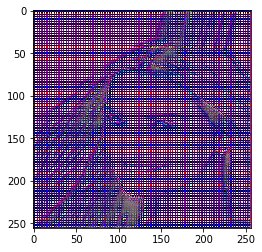

In [16]:
gen_output = generator(tf.expand_dims(inpA, 0), training=False)
gen_output = (gen_output + 1) / 2
plt.imshow(gen_output[0])
print(gen_output.shape,gen_output[0,...].numpy().max(), gen_output[0,...].numpy().min())

In [0]:
def Discriminator():
    inputs = tf.keras.layers.Input(shape=[None,None,3])
    x = inputs
    g_filter = 64
    
    down_stack = [
        downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4) # (bs, 32, 32, 256)
    ]
    
    for down in down_stack:
        x = down(x)

    last = tf.keras.layers.Conv2D(1, 4, strides=1, padding='same') # (bs, 30, 30, 1)
    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

In [18]:
discriminator = Discriminator()
dis_output = discriminator(tf.expand_dims(inpA, 0), training=False)
print(dis_output.shape)

(1, 16, 16, 1)


In [0]:
def clip(img):
    return (img + 1) / 2

In [0]:
EPOCHS = 20

In [0]:
d_A = Discriminator()
d_B = Discriminator()

g_AB = Generator()
g_BA = Generator()

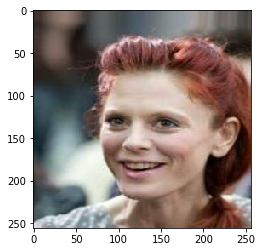

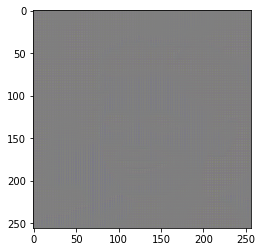

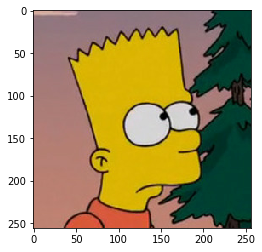

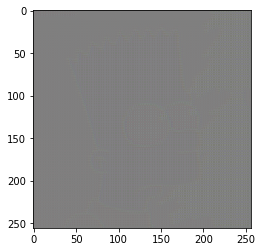

In [31]:
fake_B = g_AB(ingA, training=False)
fake_A = g_BA(ingB, training=False)
logits_A = d_A(ingA, training=False)
logits_B = d_B(ingB, training=False)

plt.figure()
plt.imshow(clip(ingA[0]))
plt.figure()
plt.imshow(clip(fake_B[0]))
plt.figure()
plt.imshow(clip(ingB[0]))
plt.figure()
plt.imshow(clip(fake_A[0]))

In [0]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
@tf.function
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [0]:
opti = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

In [0]:
valid = np.ones((BATCH_SIZE, 16, 16, 1)).astype('float32')
fake = np.zeros((BATCH_SIZE, 16, 16, 1)).astype('float32')

In [0]:
@tf.function
def train_batch(imgs_A, imgs_B):
    with tf.GradientTape() as g, tf.GradientTape() as d_tape:
        fake_B = g_AB(imgs_A, training=True)
        fake_A = g_BA(imgs_B, training=True)
        
        logits_real_A = d_A(imgs_A, training=True)
        logits_fake_A = d_A(fake_A, training=True)
        dA_loss = discriminator_loss(logits_real_A, logits_fake_A)
        
        logits_real_B = d_B(imgs_B, training=True)
        logits_fake_B = d_B(fake_B, training=True)
        dB_loss = discriminator_loss(logits_real_B, logits_fake_B)
        
        d_loss = (dA_loss + dB_loss) / 2
        # Translate images back to original domain
        reconstr_A = g_BA(fake_B, training=True)
        reconstr_B = g_AB(fake_A, training=True)
        
        id_A = g_BA(imgs_A, training=True)
        id_B = g_AB(imgs_B, training=True)


        gen_loss = tf.math.reduce_sum([
            1 * tf.math.reduce_mean(mean_squared_error(logits_fake_A, valid)),
            1 * tf.math.reduce_mean(mean_squared_error(logits_fake_B, valid)),
            10 * tf.math.reduce_mean(mean_squared_error(reconstr_A, imgs_A)),
            10 * tf.math.reduce_mean(mean_squared_error(reconstr_B, imgs_B)),
            0.1 * tf.math.reduce_mean(mean_squared_error(id_A, imgs_A)),
            0.1 * tf.math.reduce_mean(mean_squared_error(id_B, imgs_B)),
        ])
        
    gradients_of_d = d_tape.gradient(d_loss, d_A.trainable_variables + d_B.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(gradients_of_d, d_A.trainable_variables + d_B.trainable_variables))
    gradients_of_generator = g.gradient(gen_loss, g_AB.trainable_variables + g_BA.trainable_variables)
    opti.apply_gradients(zip(gradients_of_generator, g_AB.trainable_variables + g_BA.trainable_variables))
    
    return dA_loss, dB_loss, gen_loss

In [0]:
checkpoint_dird_A = 'content/gdrive/My Drive/188 HW3/train/training_checkpointsd_A'
checkpoint_prefixd_A = os.path.join(checkpoint_dird_A, "ckpt_{epoch}")

checkpoint_dird_B = 'content/gdrive/My Drive/188 HW3/train/training_checkpointsd_B'
checkpoint_prefixd_B = os.path.join(checkpoint_dird_B, "ckpt_{epoch}")

checkpoint_dirg_AB = 'content/gdrive/My Drive/188 HW3/training_checkpointsg_AB'
checkpoint_prefixg_AB = os.path.join(checkpoint_dirg_AB, "ckpt_{epoch}")

checkpoint_dirg_BA = 'content/gdrive/My drive/188 HW3/training_checkpointsg_BA'
checkpoint_prefixg_BA = os.path.join(checkpoint_dirg_BA, "ckpt_{epoch}")

In [0]:
def train(train_A_dataset, train_B_dataset, epochs):
    for epoch in range(epochs):
        start = time.time()
        
        for batch_i, (imgs_A, imgs_B) in enumerate(zip(train_A_dataset, train_B_dataset)):
            dA_loss, dB_loss, g_loss = train_batch(imgs_A, imgs_B)
            
            if batch_i % 100 == 0:
                ingA = next(iter(trainA_dataset))
                ingB = next(iter(trainB_dataset))
                print ('Time taken for epoch {} is {} sec\n'.format(epoch, time.time()-start))
                print("discriminator A: ", dA_loss.numpy())
                print("discriminator B: ", dB_loss.numpy())
                print("generator: {}\n".format(g_loss))

                fig, axs = plt.subplots(1, 2, figsize=(6, 3), sharey=True)
                gen_output = g_AB(ingA, training=False)
                gen_outputB = g_BA(ingB, training=False)
                axs[0].imshow(clip(gen_output[0]))
                axs[1].imshow(clip(gen_outputB[0]))
                plt.show()

                d_A.save_weights(checkpoint_prefixd_A.format(epoch=epoch))
                d_B.save_weights(checkpoint_prefixd_B.format(epoch=epoch))
                g_AB.save_weights(checkpoint_prefixg_AB.format(epoch=epoch))
                g_BA.save_weights(checkpoint_prefixg_BA.format(epoch=epoch))

Time taken for epoch 0 is 30.692345142364502 sec

discriminator A:  1.6305424
discriminator B:  1.4958433
generator: 9.824098587036133



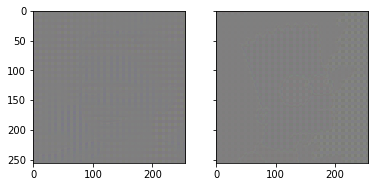

Time taken for epoch 0 is 654.096480846405 sec

discriminator A:  1.1461565
discriminator B:  1.268764
generator: 6.712153911590576



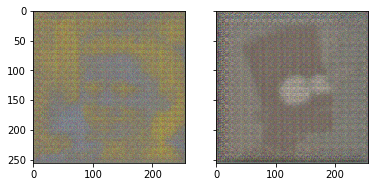

Time taken for epoch 1 is 7.812215805053711 sec

discriminator A:  1.5345776
discriminator B:  1.2030699
generator: 4.464034080505371



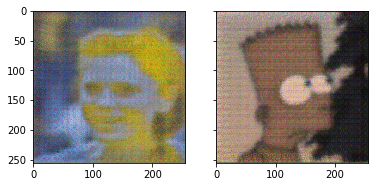

Time taken for epoch 1 is 666.3527934551239 sec

discriminator A:  1.4059619
discriminator B:  1.3675213
generator: 5.41205358505249



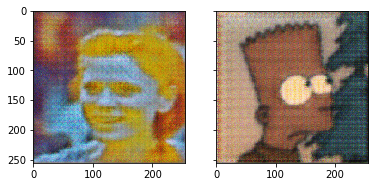

Time taken for epoch 2 is 6.923313617706299 sec

discriminator A:  1.4999257
discriminator B:  1.2260592
generator: 4.861880302429199



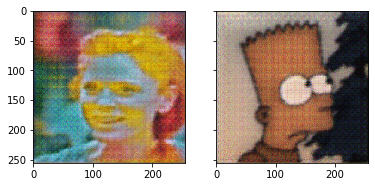

Time taken for epoch 2 is 611.2221848964691 sec

discriminator A:  1.369202
discriminator B:  1.3087621
generator: 4.564386367797852



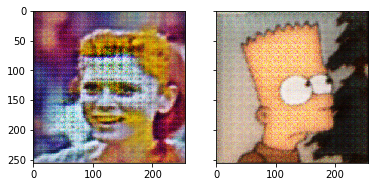

Time taken for epoch 3 is 6.782600402832031 sec

discriminator A:  1.5702142
discriminator B:  1.3413345
generator: 4.99246883392334



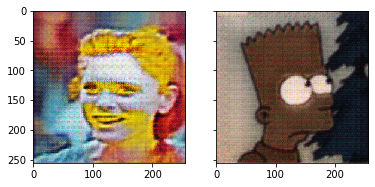

Time taken for epoch 3 is 610.0652763843536 sec

discriminator A:  1.3550406
discriminator B:  1.2497
generator: 4.427132606506348



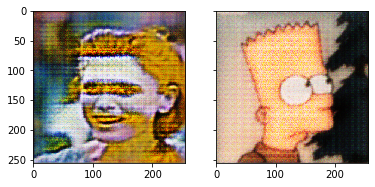

Time taken for epoch 4 is 6.771749019622803 sec

discriminator A:  1.505269
discriminator B:  1.2412837
generator: 5.10285758972168



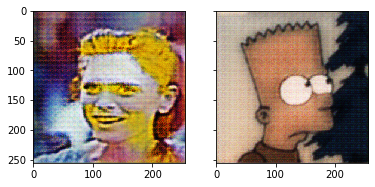

Time taken for epoch 4 is 610.9883847236633 sec

discriminator A:  1.4252498
discriminator B:  1.2228184
generator: 5.091392517089844



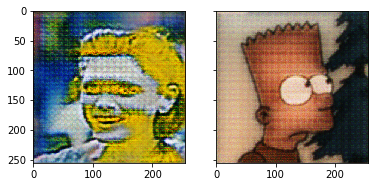

Time taken for epoch 5 is 6.773647785186768 sec

discriminator A:  1.4883883
discriminator B:  1.1895452
generator: 4.08011531829834



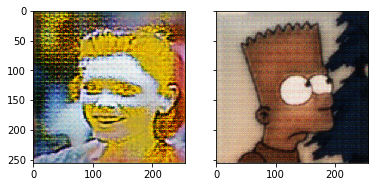

Time taken for epoch 5 is 611.3433225154877 sec

discriminator A:  1.4469945
discriminator B:  1.1843944
generator: 4.5738959312438965



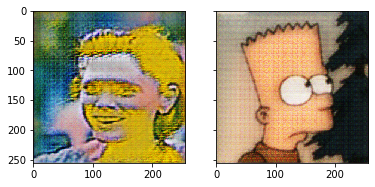

Time taken for epoch 6 is 6.791341304779053 sec

discriminator A:  1.4854033
discriminator B:  1.125944
generator: 5.086747169494629



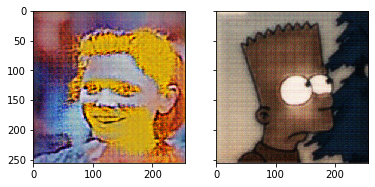

Time taken for epoch 6 is 610.5362138748169 sec

discriminator A:  1.4255
discriminator B:  1.2482963
generator: 4.297811508178711



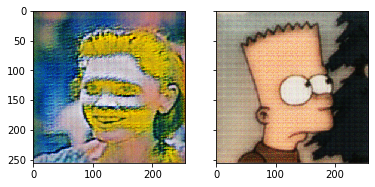

Time taken for epoch 7 is 6.833400249481201 sec

discriminator A:  1.5177926
discriminator B:  1.1422851
generator: 4.525630950927734



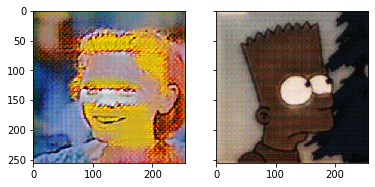

Time taken for epoch 7 is 611.8873889446259 sec

discriminator A:  1.4513521
discriminator B:  1.284371
generator: 4.442600250244141



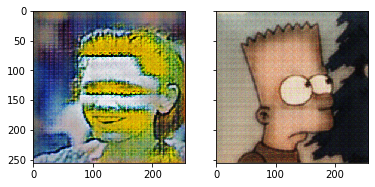

Time taken for epoch 8 is 6.815027952194214 sec

discriminator A:  1.4766779
discriminator B:  1.2301377
generator: 3.9028666019439697



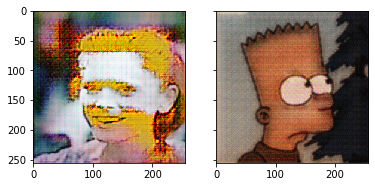

Time taken for epoch 8 is 613.1113250255585 sec

discriminator A:  1.4076651
discriminator B:  1.2108154
generator: 4.796605110168457



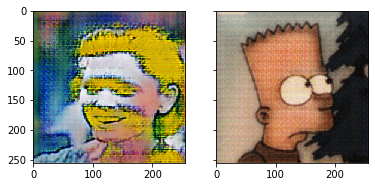

Time taken for epoch 9 is 6.786651134490967 sec

discriminator A:  1.4338096
discriminator B:  1.278666
generator: 3.994457483291626



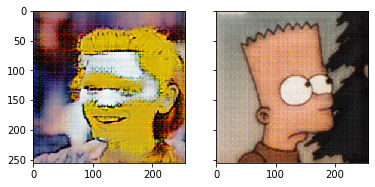

Time taken for epoch 9 is 612.6903781890869 sec

discriminator A:  1.4074111
discriminator B:  1.1582654
generator: 6.211490631103516



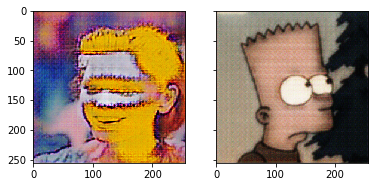

Time taken for epoch 10 is 6.859148740768433 sec

discriminator A:  1.4722176
discriminator B:  1.1505651
generator: 4.147085189819336



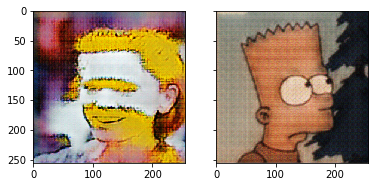

Time taken for epoch 10 is 613.1738574504852 sec

discriminator A:  1.288374
discriminator B:  1.1733016
generator: 5.533767223358154



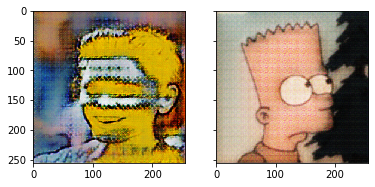

Time taken for epoch 11 is 6.9003071784973145 sec

discriminator A:  1.4819577
discriminator B:  1.006823
generator: 5.812498569488525



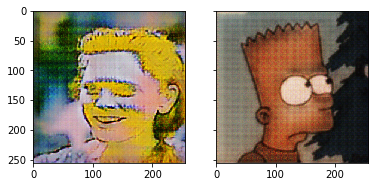

Time taken for epoch 11 is 613.2050302028656 sec

discriminator A:  1.3516653
discriminator B:  1.1510808
generator: 5.946213722229004



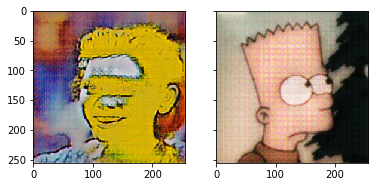

Time taken for epoch 12 is 6.840925931930542 sec

discriminator A:  1.4641697
discriminator B:  1.0067171
generator: 5.646918296813965



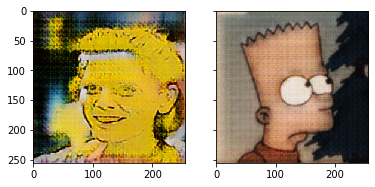

Time taken for epoch 12 is 613.3474643230438 sec

discriminator A:  1.3596724
discriminator B:  1.3986893
generator: 6.934483528137207



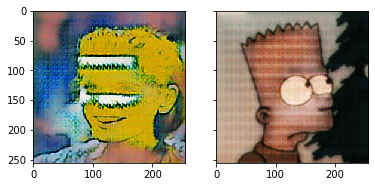

Time taken for epoch 13 is 6.909941911697388 sec

discriminator A:  1.5343665
discriminator B:  1.0791557
generator: 5.718552112579346



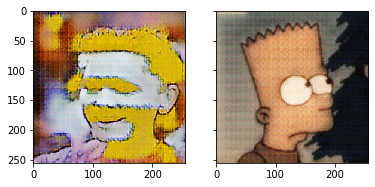

Time taken for epoch 13 is 613.8237361907959 sec

discriminator A:  1.338865
discriminator B:  1.1109519
generator: 8.285539627075195



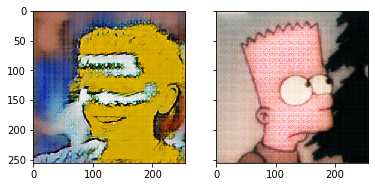

Time taken for epoch 14 is 6.792345285415649 sec

discriminator A:  1.5501565
discriminator B:  0.95575345
generator: 8.182156562805176



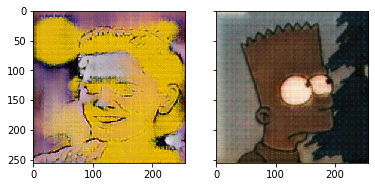

Time taken for epoch 14 is 612.0438830852509 sec

discriminator A:  1.2833927
discriminator B:  1.2784317
generator: 8.50810432434082



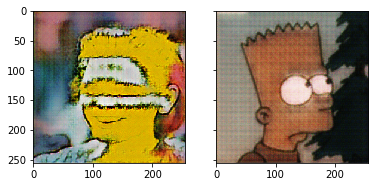

Time taken for epoch 15 is 6.850785970687866 sec

discriminator A:  1.4603376
discriminator B:  1.1555363
generator: 7.011112213134766



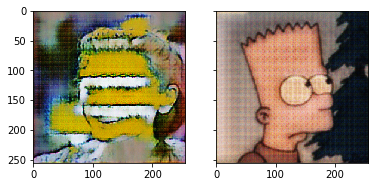

Time taken for epoch 15 is 611.5782957077026 sec

discriminator A:  1.3035443
discriminator B:  1.2404015
generator: 9.661343574523926



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


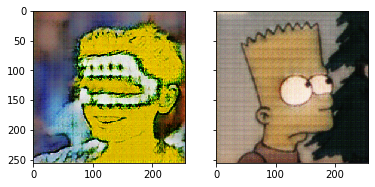

Time taken for epoch 16 is 6.814254999160767 sec

discriminator A:  1.6016526
discriminator B:  0.8579727
generator: 6.89760160446167



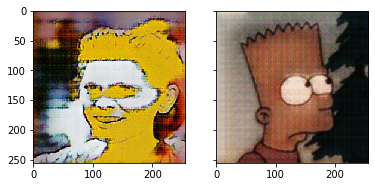

Time taken for epoch 16 is 611.2297089099884 sec

discriminator A:  1.3071215
discriminator B:  1.7215858
generator: 8.948904991149902



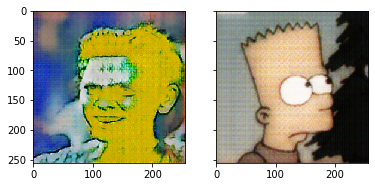

Time taken for epoch 17 is 6.90550422668457 sec

discriminator A:  1.4858668
discriminator B:  1.1263478
generator: 5.2636260986328125



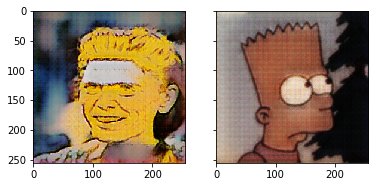

Time taken for epoch 17 is 613.760370016098 sec

discriminator A:  1.3486514
discriminator B:  1.3684168
generator: 10.376726150512695



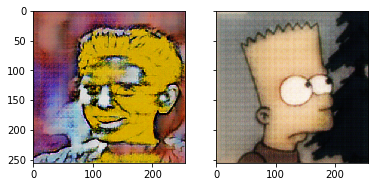

Time taken for epoch 18 is 6.842169761657715 sec

discriminator A:  1.5736564
discriminator B:  0.9469434
generator: 7.816370487213135



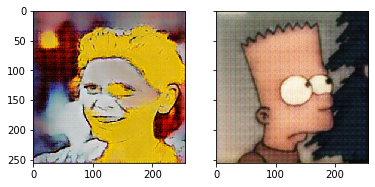

Time taken for epoch 18 is 609.2793726921082 sec

discriminator A:  1.3353151
discriminator B:  0.95878214
generator: 6.291759967803955



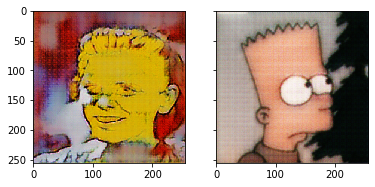

Time taken for epoch 19 is 6.881676197052002 sec

discriminator A:  1.4416325
discriminator B:  0.8462439
generator: 9.386625289916992



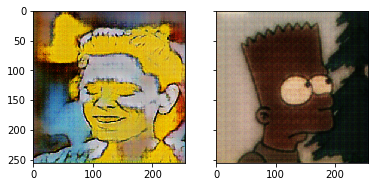

Time taken for epoch 19 is 612.5135915279388 sec

discriminator A:  1.3710778
discriminator B:  0.6093476
generator: 8.645051956176758



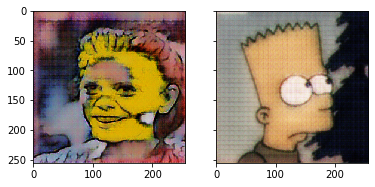

In [41]:
train(trainA_dataset, trainB_dataset, EPOCHS)

In [0]:
d_A.save_weights('/content/gdrive/My Drive/188 HW3/train/d_A_20.h5')
d_B.save_weights('/content/gdrive/My Drive/188 HW3/train/d_B_20.h5')
g_AB.save_weights('/content/gdrive/My Drive/188 HW3/train/g_AB_20.h5')
g_BA.save_weights('/content/gdrive/My Drive/188 HW3/train/g_BA_20.h5')

In [0]:
d_A.load_weights('/content/gdrive/My Drive/188 HW3/train/d_A_20.h5')
d_B.load_weights('/content/gdrive/My Drive/188 HW3/train/d_B_20.h5')
g_AB.load_weights('/content/gdrive/My Drive/188 HW3/train/g_AB_20.h5')
g_BA.load_weights('/content/gdrive/My Drive/188 HW3/train/g_BA_20.h5')

In [0]:
test_dataset = '/content/gdrive/My Drive/188 HW3/test/'
testA_dataset = tf.data.Dataset.list_files(PATH+'human/*.jpg')
testA_dataset = testA_dataset.shuffle(BUFFER_SIZE)
testA_dataset = testA_dataset.map(load_image_train)
testA_dataset = testA_dataset.batch(BATCH_SIZE, drop_remainder=True)
testA_dataset = testA_dataset.prefetch(buffer_size=1)

testB_dataset = tf.data.Dataset.list_files(PATH+'simpson/*.jpg')
testB_dataset = testB_dataset.shuffle(BUFFER_SIZE)
testB_dataset = testB_dataset.map(load_image_train)
testB_dataset = testB_dataset.batch(BATCH_SIZE, drop_remainder=True)
testB_dataset = testB_dataset.prefetch(buffer_size=1)

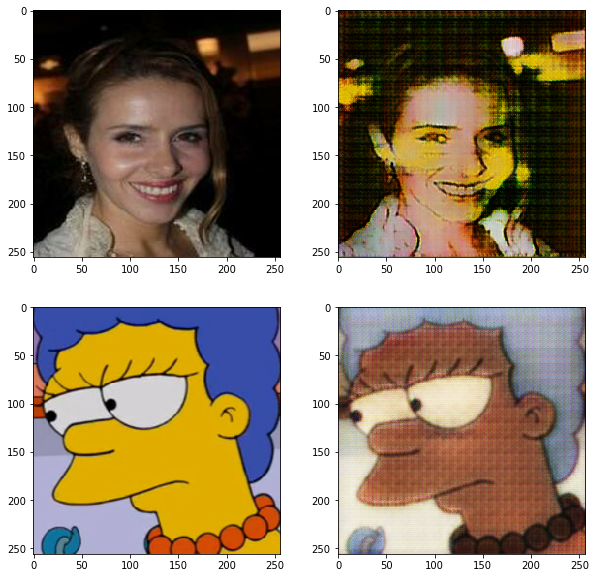

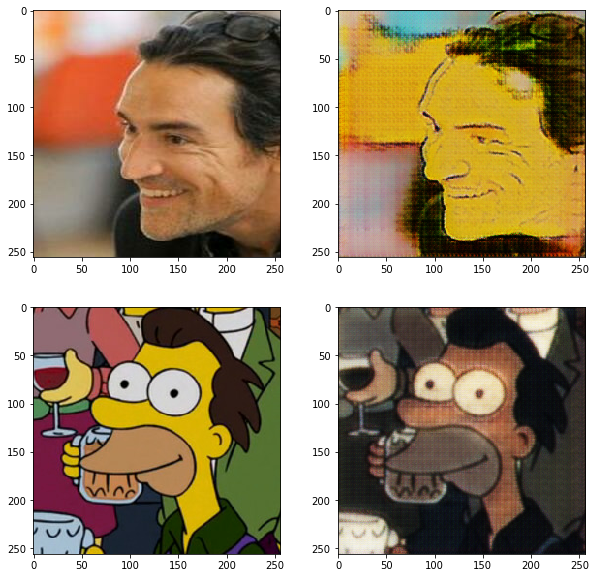

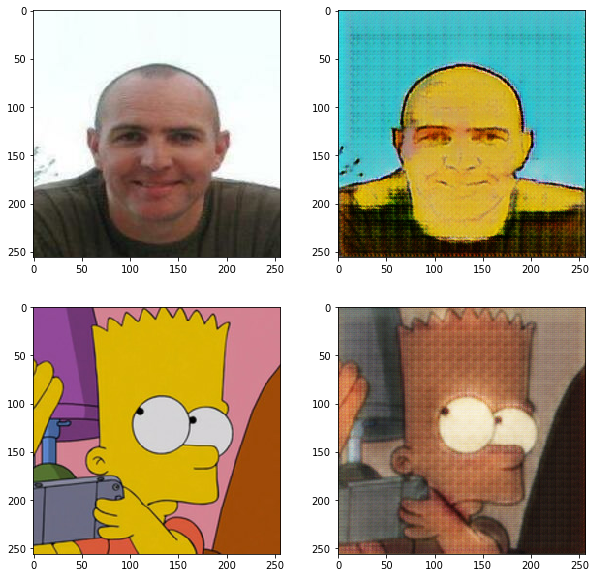

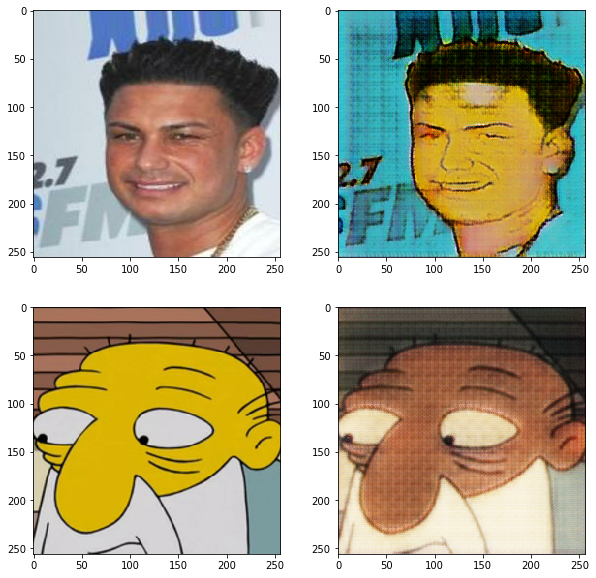

In [54]:
n = 3
for batch_i, (imgs_A, imgs_B) in enumerate(zip(testA_dataset, testB_dataset)):
    fake_B = g_AB(imgs_A, training=False)
    fake_A = g_BA(imgs_B, training=False)
  
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))

    axs[0][0].imshow(clip(imgs_A[0]))
    axs[0][1].imshow(clip(fake_B[0]))
    axs[1][0].imshow(clip(imgs_B[0]))
    axs[1][1].imshow(clip(fake_A[0]))
    plt.show()
    
    n -= 1
    if n < 0:
        break
